In [ ]:
import pandas as pd
import json
import cv2
import matplotlib.pyplot as plt
import seaborn as sns
import albumentations as A
import os

In [ ]:
train_json_path = '/opt/ml/detection/dataset/train.json'
with open(train_json_path,'r') as j:
    train=json.loads(j.read())
    
annotations = train['annotations']
images_info = train['images']

annotation_df = pd.DataFrame(annotations) #annotation데이터
images_info_df = pd.DataFrame(images_info) #image파일명 데이터

images_info_df = images_info_df.rename(columns={"id": "image_id"})
images_info_df = images_info_df[['file_name', 'image_id']] #파일명과 image_id만

data = annotation_df.merge(images_info_df, how='left', on='image_id')

In [ ]:
data.head()

,image_id,category_id,area,bbox,iscrowd,id,file_name
0,0,0,257301.66,"[197.6, 193.7, 547.8, 469.7]",0,0,train/0000.jpg
1,1,3,10402.56,"[0.0, 407.4, 57.6, 180.6]",0,1,train/0001.jpg
2,1,7,26259.36,"[0.0, 455.6, 144.6, 181.6]",0,2,train/0001.jpg
3,1,4,69096.17,"[722.3, 313.4, 274.3, 251.9]",0,3,train/0001.jpg
4,1,5,24164.58,"[353.2, 671.0, 233.7, 103.4]",0,4,train/0001.jpg


In [ ]:
def read_image(dataset_path, file_path):
    image = cv2.imread(dataset_path + file_path, cv2.IMREAD_COLOR)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)# opencv convention BGR -> matplotlib convention RGB
    return image

def plot_bbox(image, anns, image_id):
    for ann in anns:
        xmin, ymin, w, h = map(int, ann)
        image = cv2.rectangle(image, (xmin, ymin), (xmin + w, ymin + h), (0, 0, 255), 3)
    plt.imshow(image)
    plt.title(f'id={image_id}, ({len(anns)} boxes)', fontsize=14) # 이미지당 annot개수 표시
    
def get_annotations(df, image_num):
    image_df = df[df['image_id'] == image_num]
    anns = image_df.bbox.values.tolist()
    #anns = [ann for ann in df['bbox'] if df['image_id'] == image_num]
    return anns

In [ ]:
def image_with_bbox_by_12_id(sample_id):
    '''
    sample_id : id 입력 (예) range(12)
    
    12개의 sample id에 대해 bbox가 그려진 이미지를 시각화합니다.
    이미지의 title은 bbox의 개수입니다.
    '''
    dataset_path = '/opt/ml/detection/dataset/'
    fig = plt.figure(figsize=(24,20))
    for i, image_id in enumerate(sample_id):
        ax = fig.add_subplot(3, 4, i+1)
        id_len = len(str(image_id)) 
        image = read_image(dataset_path, 'train/'+'0'*(4-id_len)+str(image_id)+'.jpg')
        anns = get_annotations(data, image_id)
        plot_bbox(image, anns, image_id)

## train 이미지 확인

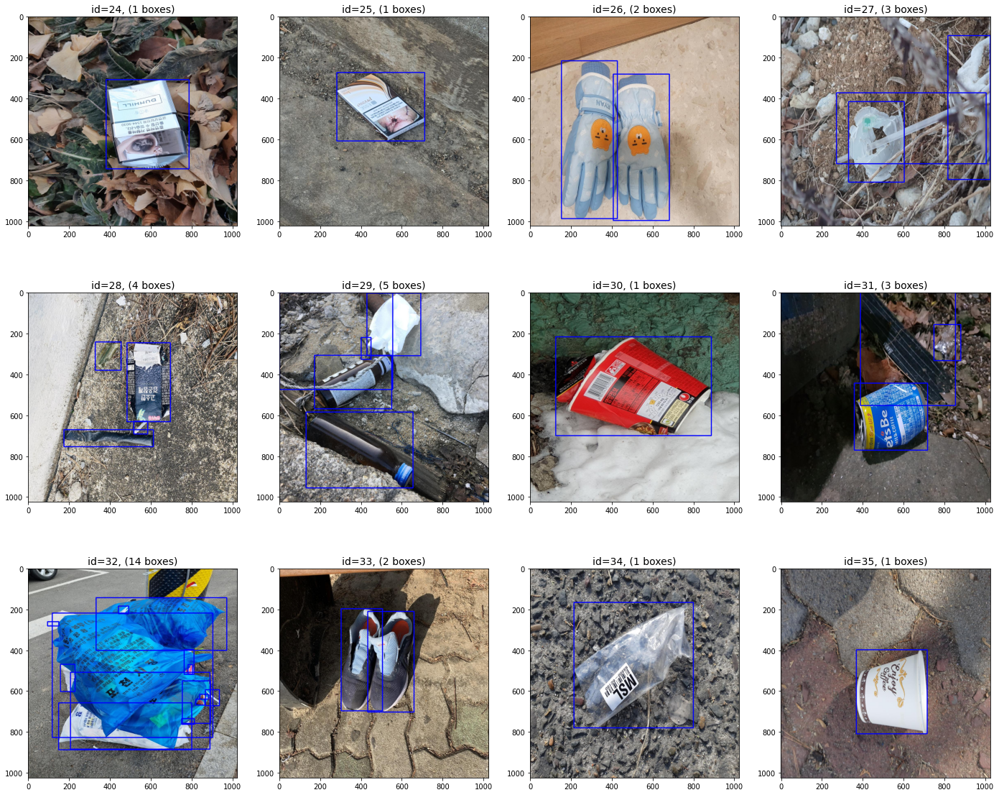

In [ ]:
# id 24~35
sample_id = range(24,36)
image_with_bbox_by_12_id(sample_id)

## 예상되는 문제점 : 어두운 객체
- 밤과 낮의 사진 밝기 차이-> 모델 학습에 어떤 영향을?
    - 어둡다면 객체를 detect하기 어려울 수 있지만 
    - 밝기가 다양한 데이터로 학습하면 보다 밝기가 일정한 데이터로 학습할 때보다 robust한 모델이 될 수도 있을 것 같음. 
- 이미지에 그늘진 부분이 존재한다든지, 조명 때문에 일부 영역만 밝은 경우가 있었다. 
    - 이처럼 영역별로 밝기가 고르지 않은 경우, 모델이 밝은쪽/어두운쪽 둘중 하나의 영역만 집중하여 학습할 것이라 예상. 
    - 실험 결과 : valid mAP가 0.504에서 0.531로 소폭 상승
        - 통제 변인 : swinT(backbone), faster RCNN(detector), fpn(neck) mmdetection library, image_size=1024, batch_size=8, epoch=32
        - 조작 변인 : augmentation
            - CLAHE(clip_limit=2)
            - Horizontal flip
            - RandomBrightnessContrast(brightness_limit=[0.1, 0.2], contrast_limit=[0.1, 0.2]) -> 효과가 크지 않아 삭제



## 3. augmentation이전(좌)과 이후(우) 이미지 비교

True

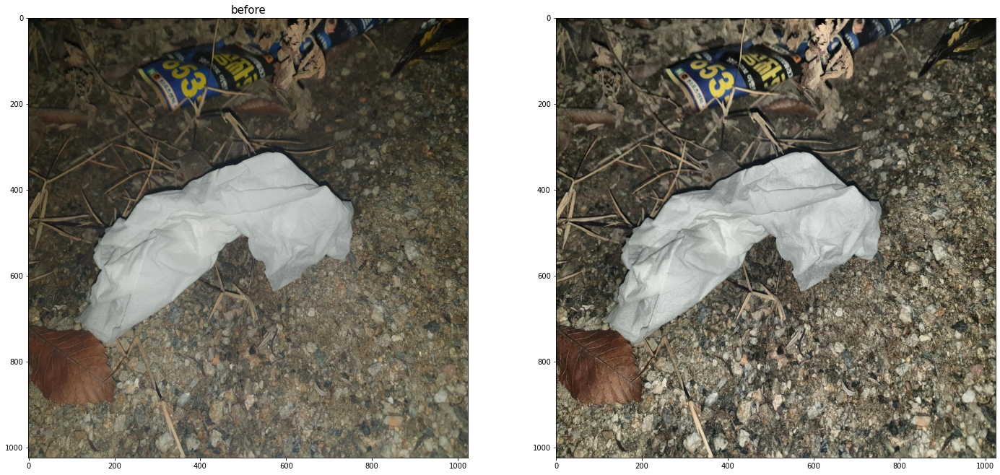

In [ ]:
dataset_root = '/opt/ml/detection/dataset/train/'

# Declare an augmentation pipeline
transform = A.Compose([
    A.CLAHE(clip_limit=2.0,p=1.0),
    A.HorizontalFlip(p=0.5),
])

# Read an image with OpenCV and convert it to the RGB colorspace
image = cv2.imread(os.path.join(dataset_root,'0043.jpg'))
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Augment an image
transformed = transform(image=image)
transformed_image = transformed["image"]
fig = plt.figure(figsize=(24,20))
fig.add_subplot(1,2,1)
plt.imshow(image)
plt.title('before', fontsize=15)
fig.add_subplot(1,2,2)
plt.imshow(transformed_image)
transformed_image = cv2.cvtColor(transformed_image, cv2.COLOR_RGB2BGR)
cv2.imwrite('/opt/ml/detection/dataset/augmented_train/'+'augmented_0043.jpg',transformed_image)

True

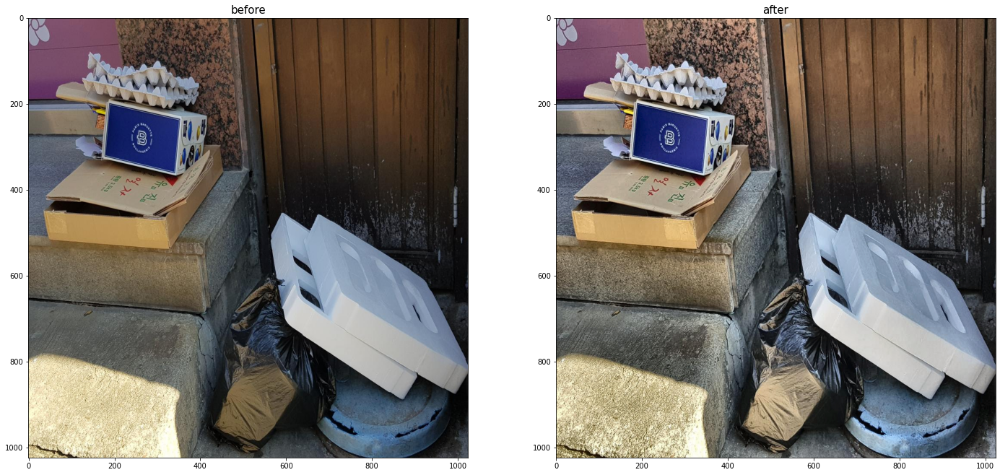

In [ ]:
# Declare an augmentation pipeline
transform = A.Compose([
    A.CLAHE(clip_limit=4.0,p=1.0),
    A.HorizontalFlip(p=0.5),
])

# Read an image with OpenCV and convert it to the RGB colorspace
image = cv2.imread(os.path.join(dataset_root,'0051.jpg'))
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Augment an image
transformed = transform(image=image)
transformed_image = transformed["image"]
fig = plt.figure(figsize=(24,20))
fig.add_subplot(1,2,1)
plt.imshow(image)
plt.title('before', fontsize=15)
fig.add_subplot(1,2,2)
plt.imshow(transformed_image)
plt.title('after', fontsize=15)
transformed_image = cv2.cvtColor(transformed_image, cv2.COLOR_RGB2BGR)
cv2.imwrite('/opt/ml/detection/dataset/augmented_train/'+'augmented_0051.jpg',transformed_image)

True

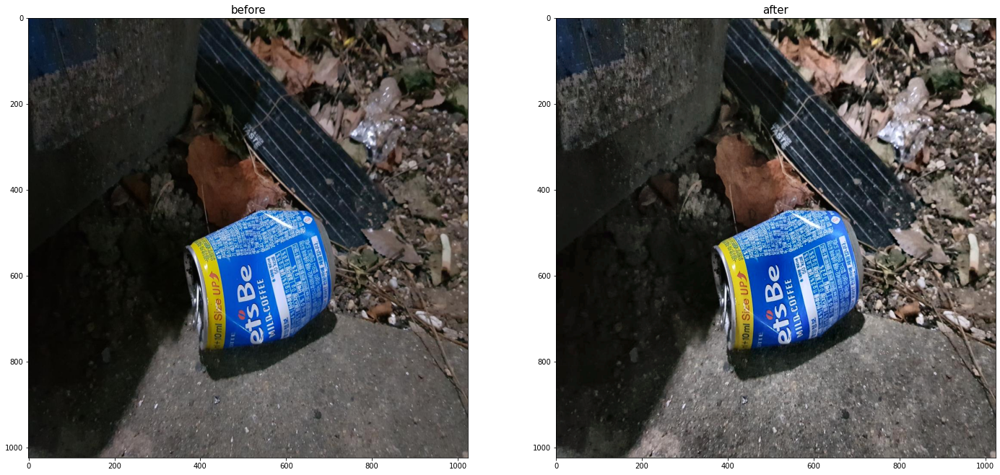

In [ ]:
# Declare an augmentation pipeline
transform = A.Compose([
    A.CLAHE(clip_limit=4, p=1.0),
    A.HorizontalFlip(p=0.2),

])

# Read an image with OpenCV and convert it to the RGB colorspace
image = cv2.imread(os.path.join(dataset_root,'0031.jpg'))
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Augment an image
transformed = transform(image=image)
transformed_image = transformed["image"]
fig = plt.figure(figsize=(24,20))
fig.add_subplot(1,2,1)
plt.imshow(image)
plt.title('before', fontsize=15)
fig.add_subplot(1,2,2)
plt.imshow(transformed_image)
plt.title('after', fontsize=15)
transformed_image = cv2.cvtColor(transformed_image, cv2.COLOR_RGB2BGR)
cv2.imwrite('/opt/ml/detection/dataset/augmented_train/'+'augmented_0031.jpg',transformed_image)

Text(0.5, 1.0, 'after')

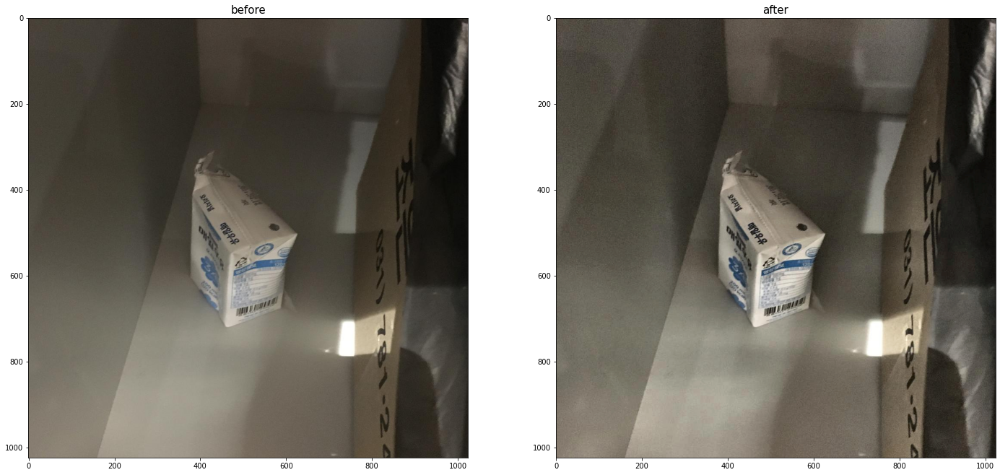

In [ ]:
# Declare an augmentation pipeline
transform = A.Compose([
    A.CLAHE(clip_limit=2,p=1.0),
    A.HorizontalFlip(p=0.2),

])

# Read an image with OpenCV and convert it to the RGB colorspace
image = cv2.imread(os.path.join(dataset_root,'0072.jpg'))
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Augment an image
transformed = transform(image=image)
transformed_image = transformed["image"]
fig = plt.figure(figsize=(24,20))
fig.add_subplot(1,2,1)
plt.imshow(image)
plt.title('before', fontsize=15)
fig.add_subplot(1,2,2)
plt.imshow(transformed_image)
plt.title('after', fontsize=15)
# transformed_image = cv2.cvtColor(transformed_image, cv2.COLOR_RGB2BGR)
# cv2.imwrite('/opt/ml/detection/dataset/augmented_train/'+'augmented_0031.jpg',transformed_image)

Text(0.5, 1.0, 'after')

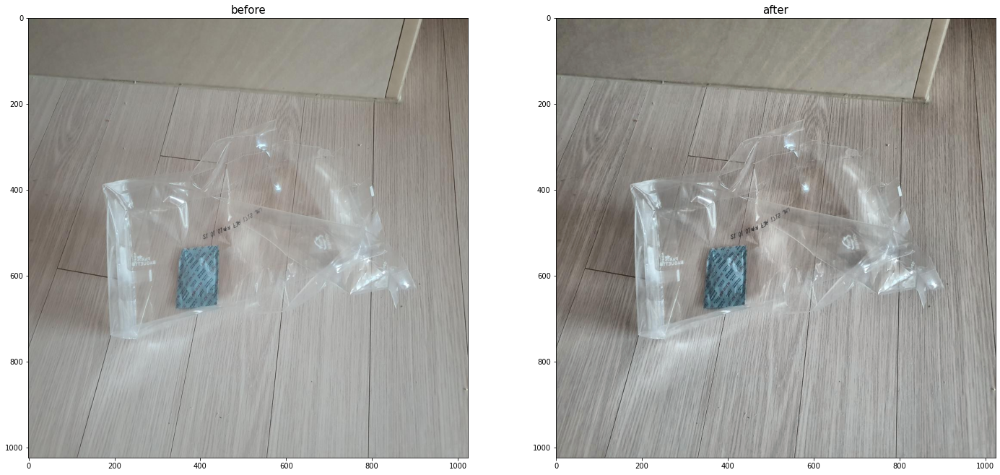

In [ ]:
# Declare an augmentation pipeline
transform = A.Compose([
    A.CLAHE(clip_limit=2,p=1.0),
    A.HorizontalFlip(p=0.2),
    
])

# Read an image with OpenCV and convert it to the RGB colorspace
image = cv2.imread(os.path.join(dataset_root,'0076.jpg'))
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Augment an image
transformed = transform(image=image)
transformed_image = transformed["image"]
fig = plt.figure(figsize=(24,20))
fig.add_subplot(1,2,1)
plt.imshow(image)
plt.title('before', fontsize=15)
fig.add_subplot(1,2,2)
plt.imshow(transformed_image)
plt.title('after', fontsize=15)
# transformed_image = cv2.cvtColor(transformed_image, cv2.COLOR_RGB2BGR)
# cv2.imwrite('/opt/ml/detection/dataset/augmented_train/'+'augmented_0031.jpg',transformed_image)